<a href="https://colab.research.google.com/github/Matheus-Reis-N/eda_and_clustering_medical_data/blob/main/EDA_and_Clustering_on_Medical_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## EDA - Fase Pre Modelagem

### ELT e imports

In [ ]:
!pip install pycaret

In [ ]:
import pandas as pd
from pycaret.clustering import *

In [ ]:
tbExtractCusto = '/content/tbExtractCusto.parquet'
#tbPopulacaoAssoc = '/content/tbPopulacaoAssoc.parquet'
#tbPopulacaoTijuco = '/content/tbPopulacaoTijuco.parquet'
#tbPopulacaoUfu = '/content/tbPopulacaoUfu.parquet'

In [ ]:
df = pd.read_parquet(tbExtractCusto)

In [ ]:
df['Qt_Autorizada'] = df['Qt_Autorizada'].astype('float32')
df['valorCusto'] = df['valorCusto'].astype('float32')

### Descritivo

#### Geral

In [ ]:
df.head()

,ChaveBeneficiarioPlanoSaude,Genero,FaixaEtaria,DtNascimento,CodigoExecutante,EspecialidadeExecutante,CodigoSolicitante,EspecialidadeSolicitante,DtSolicitacao,DtRealizacao,Procedimento Codigo,Procedimento Nome,Qt_Autorizada,valorCusto
0,128842006,Masculino,44 a 48,1976-11-28,"OS:J5;""Q:,M/HR"":[*@3"",",Clinica Medica,E8(!(S[(R7]6PAE;==)O0#,Clinica Medica,2022-01-08,2022-01-08,23991488,Pacote Pronto Atendimento - Umc,1.0,138.000000
1,128842006,Masculino,44 a 48,1976-11-28,E8(!(S[(R7]6PAE;==)O0#,Clinica Medica,E8(!(S[(R7]6PAE;==)O0#,Clinica Medica,2022-01-08,2022-01-08,10101039,Consulta em pronto socorro,1.0,62.000000
2,128842006,Masculino,44 a 48,1976-11-28,"L.05`K`U+2OD*%!_10D""C$",Patologia Clinica/Medicina Laboratorial,MOI+L;EE)YM_RH^5$[`)]+,Clinica Medica,2022-01-08,2022-01-09,40314618,Sars-cov-2 (coronavirus Covid-19) - Pesquisa P...,1.0,220.000000
3,128842006,Masculino,44 a 48,1976-11-28,"L.05`K`U+2OD*%!_10D""C$",Patologia Clinica/Medicina Laboratorial,E8(!(S[(R7]6PAE;==)O0#,Clinica Medica,2022-01-08,2022-01-08,40324192,"Antigeno NS1 do virus da dengue, pesquisa",1.0,47.450001
4,128640979,Feminino,39 a 43,1984-02-09,"CA_5NA=45""/<L)""AFT?FM&",Ginecologia e Obstetricia,"CA_5NA=45""/<L)""AFT?FM&",Ginecologia e Obstetricia,2021-12-29,2021-12-29,10101012,Consulta em consultorio (no horario normal ou ...,1.0,111.599998


In [ ]:
df.columns

Index(['ChaveBeneficiarioPlanoSaude', 'Genero', 'FaixaEtaria', 'DtNascimento',
       'CodigoExecutante', 'EspecialidadeExecutante', 'CodigoSolicitante',
       'EspecialidadeSolicitante', 'DtSolicitacao', 'DtRealizacao',
       'Procedimento Codigo', 'Procedimento Nome', 'Qt_Autorizada',
       'valorCusto'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2896567 entries, 0 to 2896566
Data columns (total 14 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   ChaveBeneficiarioPlanoSaude  int64         
 1   Genero                       object        
 2   FaixaEtaria                  object        
 3   DtNascimento                 datetime64[us]
 4   CodigoExecutante             object        
 5   EspecialidadeExecutante      object        
 6   CodigoSolicitante            object        
 7   EspecialidadeSolicitante     object        
 8   DtSolicitacao                datetime64[us]
 9   DtRealizacao                 datetime64[us]
 10  Procedimento Codigo          object        
 11  Procedimento Nome            object        
 12  Qt_Autorizada                float32       
 13  valorCusto                   float32       
dtypes: datetime64[us](3), float32(2), int64(1), object(8)
memory usage: 287.3+ MB


In [ ]:
df.describe()

,ChaveBeneficiarioPlanoSaude,DtNascimento,DtSolicitacao,DtRealizacao,Qt_Autorizada,valorCusto
count,2.896567e+06,2896566,2802913,2896567,2.896392e+06,2.896376e+06
mean,4.452389e+08,1969-11-15 05:02:15.204791,2023-03-06 09:40:33.381413,2023-03-19 10:52:50.404965,2.554957e+00,8.175443e+01
min,6.466496e+07,1918-09-21 00:00:00,2018-08-21 00:00:00,2013-06-12 00:00:00,0.000000e+00,0.000000e+00
25%,3.702206e+08,1949-11-22 00:00:00,2022-07-03 00:00:00,2022-07-15 00:00:00,1.000000e+00,3.470000e+00
50%,4.133476e+08,1966-01-07 00:00:00,2023-03-08 00:00:00,2023-03-20 00:00:00,1.000000e+00,1.275000e+01
75%,6.242629e+08,1987-12-29 00:00:00,2023-11-03 00:00:00,2023-11-13 00:00:00,1.000000e+00,6.104000e+01
max,1.209278e+09,2024-06-17 00:00:00,2024-08-19 00:00:00,2024-08-20 00:00:00,8.000000e+03,1.286340e+05
std,2.479584e+08,NaN,NaN,NaN,4.595584e+01,6.513181e+02


In [ ]:
df.isnull().sum()

,0
ChaveBeneficiarioPlanoSaude,0
Genero,1
FaixaEtaria,1
DtNascimento,1
CodigoExecutante,912282
EspecialidadeExecutante,0
CodigoSolicitante,30694
EspecialidadeSolicitante,0
DtSolicitacao,93654
DtRealizacao,0


In [ ]:
df['DtSolicitacao'].isnull().sum()

print(f'Razão de dados faltantes na coluna DtSolicitacao: {(df["DtSolicitacao"].isnull().sum() / len(df)):.2f} %')

Razão de dados faltantes na coluna DtSolicitacao: 0.03 %


In [ ]:
df_antes = df.copy()
df = df.drop_duplicates()

linhas_removidas = len(df_antes) - len(df)

porcentagem_reducao = (linhas_removidas / len(df_antes)) * 100

print(f"Quantidade de linhas Duplicadas: {linhas_removidas}")
print(f"Porcentagem de redução do dataset: {porcentagem_reducao:.2f}%")

Quantidade de linhas Duplicadas: 240817
Porcentagem de redução do dataset: 8.31%


#### Features 'EspecialidadeExecutante' e 'EspecialidadeSolicitante'

In [ ]:
espec_exec = df['EspecialidadeExecutante'].unique()

print(f'Quantidade de especialidade executante únicas : {len(espec_exec)}')

print('\n')

count_espec_exec = df['EspecialidadeExecutante'].value_counts()
freq_relativa_espec_exec = df['EspecialidadeExecutante'].value_counts(normalize=True)
freq_acumulada_espec_exec = df['EspecialidadeExecutante'].value_counts(normalize=True).cumsum()

df_espec_exec = pd.DataFrame({
    'Contagem': count_espec_exec,
    'Frequência Relativa': (freq_relativa_espec_exec*100).round(2),
    'Frequência Acumulada': (freq_acumulada_espec_exec*100).round(2)
})

df_espec_exec

Quantidade de especialidade executante únicas : 79




,Contagem,Frequência Relativa,Frequência Acumulada
EspecialidadeExecutante,,,
Nao Informado,1681118,58.04,58.04
Clinica Medica,553808,19.12,77.16
Fisioterapia,69436,2.40,79.55
Medicina Física e Reabilitação,66208,2.29,81.84
Ortopedia e Traumatologia,60836,2.10,83.94
...,...,...,...
Radiodiagnóstico,4,0.00,100.00
Endoscopia Ginecológica,3,0.00,100.00
Genética Médica,2,0.00,100.00


58.04 % da especialidade executante não está especificado.

Este número é extremamente alto, inviabiliza a criação de modelos

In [ ]:
espec_solic = df['EspecialidadeSolicitante'].unique()

print(f'Quantidade de especialidade solicitante únicas : {len(espec_solic)}')

print('\n')

count_espec_solic = df['EspecialidadeSolicitante'].value_counts()
freq_relativa_espec_solic = df['EspecialidadeSolicitante'].value_counts(normalize=True)
freq_acumulada_espec_solic = df['EspecialidadeSolicitante'].value_counts(normalize=True).cumsum()

df_espec_solic = pd.DataFrame({
    'Contagem': count_espec_solic,
    'Frequência Relativa': (freq_relativa_espec_solic*100).round(2),
    'Frequência Acumulada': (freq_acumulada_espec_solic*100).round(2)
})

df_espec_solic

Quantidade de especialidade solicitante únicas : 88




,Contagem,Frequência Relativa,Frequência Acumulada
EspecialidadeSolicitante,,,
Clinica Medica,489528,16.90,16.90
Nao Informado,421238,14.54,31.44
Cardiologia,253254,8.74,40.19
Ginecologia e Obstetricia,227459,7.85,48.04
Ortopedia e Traumatologia,192350,6.64,54.68
...,...,...,...
Genética Médica,11,0.00,100.00
Ultrassonografia Geral,9,0.00,100.00
Radiodiagnóstico,2,0.00,100.00


14.54 % da especialidade das solicitações não foram especificadas neste dataset

In [ ]:
print(f'Quantidade de procedimentos solicitados nunca executados : {len(espec_solic) - len(espec_exec)}\n')
procedimentos_solicitados_nunca_executados = [print(solicitacao) for solicitacao in espec_solic if solicitacao not in espec_exec]

Quantidade de procedimentos solicitados nunca executados : 9

Holter 24 horas
Ultrassonografia Geral
Hemodiálise
Cirurgia Videolaparoscópica
Densitometria Óssea
Nefrologia Pediátrica 
Psicoterapia
Diálise
Day Hospital
Hepatologista
Cancerologia


#### Feature 'Procedimento Codigo'

In [ ]:
proc_cod = df['Procedimento Codigo'].unique()

print(f'Quantidade de Procedimento Código únicos : {len(proc_cod)}')

print('\n')

count_proc_cod = df['Procedimento Codigo'].value_counts()
freq_relativa_proc_cod = df['Procedimento Codigo'].value_counts(normalize=True)
freq_acumulada_proc_cod = df['Procedimento Codigo'].value_counts(normalize=True).cumsum()
num_ocorrencias = count_proc_cod.value_counts().sort_index()
num_ocorrencias_relativa = num_ocorrencias / num_ocorrencias.sum()
num_ocorrencias_acumulado = num_ocorrencias.cumsum() / num_ocorrencias.sum()

df_proc_cod = pd.DataFrame({
    'Contagem': count_proc_cod,
    'Frequência Relativa': (freq_relativa_proc_cod*100).round(2),
    'Frequência Acumulada': (freq_acumulada_proc_cod*100).round(2)
})

display(df_proc_cod)

print('\n')

frequencia_ocorrencias_df = pd.DataFrame({
    'Numero de Ocorrencias': num_ocorrencias.index,
    'Quantidade de Procedimentos': num_ocorrencias.values,
    'Frequencia Relativa': (num_ocorrencias_relativa*100).round(2),
    'Frequencia Acumulada': (num_ocorrencias_acumulado*100).round(2)
})

frequencia_ocorrencias_df.head(15).set_index('Numero de Ocorrencias')

Quantidade de Procedimento Código únicos : 12493




,Contagem,Frequência Relativa,Frequência Acumulada
Procedimento Codigo,,,
10101012,215490,7.44,7.44
40304361,76582,2.64,10.08
40301630,55620,1.92,12.00
50000470,54778,1.89,13.89
70014370,51092,1.76,15.66
...,...,...,...
00406759,1,0.00,100.00
00166553,1,0.00,100.00
78619440,1,0.00,100.00


,Quantidade de Procedimentos,Frequencia Relativa,Frequencia Acumulada
Numero de Ocorrencias,,,
1,3457,27.67,27.67
2,1358,10.87,38.54
3,889,7.12,45.66
4,595,4.76,50.42
5,437,3.50,53.92
6,350,2.80,56.72
7,257,2.06,58.78
8,251,2.01,60.79
9,212,1.70,62.48


In [ ]:
uma_ocorrencia = frequencia_ocorrencias_df['Quantidade de Procedimentos'].iloc[0]
soma_primeiras_10 = frequencia_ocorrencias_df['Quantidade de Procedimentos'].iloc[:10].sum()
soma_total = frequencia_ocorrencias_df['Quantidade de Procedimentos'].sum()

razao_1_ocorrencia = uma_ocorrencia/soma_total
razao_menos_de_10_ocorrencias = soma_primeiras_10/soma_total

print(f'Soma dos Procedimentos com uma única ocorrência : {uma_ocorrencia}')
print(f'Soma dos Procedimentos de até 10 ocorrências : {soma_primeiras_10}')
print(f'Razão de procedimentos com uma única ocorrência : {razao_1_ocorrencia*100:.2f}%')
print(f'Razão de procedimentos de até 10 ocorrências : {razao_menos_de_10_ocorrencias*100:.2f}%')

Soma dos Procedimentos com uma única ocorrência : 3457
Soma dos Procedimentos de até 10 ocorrências : 7989
Razão de procedimentos com uma única ocorrência : 27.67%
Razão de procedimentos de até 10 ocorrências : 63.95%


1) Procedimentos de até 10 ocorrências representam 63.95 % isso inviabiliza qualquer modelo, pois não existem padrões de repetição o suficiente para serem identificados

Conclusão : Ou aumetá-se o dataset ou retiram uma amostra mais equilibrada desde que reprensetativa e significante

2) A quantidade de procedimentos realizados únicos são 79 mas a quantidade de procedimento código únicos é 12493.

Conclusão : A hierarquia destes códigos é extremamente alta, precisa ser mais específico

#### Feature 'FaixaEtaria'

In [ ]:
faixa_et = df['FaixaEtaria'].unique()

print(f'Quantidade de Faixas Etárias : {len(faixa_et)}\n')

for i in faixa_et:
  print(i)

Quantidade de Faixas Etárias : 11

44 a 48
39 a 43
00 a 18
59 e acima
19 a 23
24 a 28
54 a 58
49 a 53
29 a 33
34 a 38
None


In [ ]:
total_count = 0

for faixa in faixa_et:
    count = len(df[df["FaixaEtaria"] == faixa])
    print(f'Quantidade de {faixa} : {count}')
    total_count += count


total_soma = 0
count_cinquenta_e_nove_ou_mais = len(df[df["FaixaEtaria"] == '59 e acima'])

for faixa in faixa_et:
    if faixa != '59 e acima':
      soma = len(df[df["FaixaEtaria"] == faixa])
      total_soma += soma

media = total_soma / (len(faixa_et)-2)


print(f'\nTotal contagem: {total_count}')
print(f'Total no DataFrame: {len(df)}\n')

print(f'A Faixa Etária 59 e acima é {(count_cinquenta_e_nove_ou_mais/media):.2f} vezes maior que as demais faixas etárias')

Quantidade de 44 a 48 : 162801
Quantidade de 39 a 43 : 189153
Quantidade de 00 a 18 : 300614
Quantidade de 59 e acima : 1437737
Quantidade de 19 a 23 : 77535
Quantidade de 24 a 28 : 101654
Quantidade de 54 a 58 : 140216
Quantidade de 49 a 53 : 137030
Quantidade de 29 a 33 : 144142
Quantidade de 34 a 38 : 205684
Quantidade de None : 0

Total contagem: 2896566
Total no DataFrame: 2896567

A Faixa Etária 59 e acima é 8.87 vezes maior que as demais faixas etárias


### Séries Temporais

In [ ]:
df_copy = df.copy()

In [ ]:
df_sem_colunas = df_copy.drop(columns=['CodigoExecutante', 'CodigoSolicitante', 'ChaveBeneficiarioPlanoSaude', 'Procedimento Nome'])

In [ ]:
df_solicitacao_ordenado = df_sem_colunas.sort_values(by='DtSolicitacao')

df_realizacao_ordenado = df_sem_colunas.sort_values(by='DtRealizacao')

print("Ordenado por data da solicitação :\n")
display(df_solicitacao_ordenado)

print("\n\nOrdenado por data da realização : \n")
df_realizacao_ordenado

Ordenado por data da solicitação :



,Genero,FaixaEtaria,DtNascimento,EspecialidadeExecutante,EspecialidadeSolicitante,DtSolicitacao,DtRealizacao,Procedimento Codigo,Qt_Autorizada,valorCusto
560922,Masculino,59 e acima,1943-04-22,Nao Informado,Pneumologia,2018-08-21,2022-07-01,57556792,3.0,75.000000
560909,Masculino,59 e acima,1943-04-22,Nao Informado,Pneumologia,2018-08-21,2022-06-01,70851840,2.0,36.139999
560936,Masculino,59 e acima,1943-04-22,Nao Informado,Pneumologia,2018-08-21,2022-07-01,60026391,3.0,32.009998
560917,Masculino,59 e acima,1943-04-22,Nao Informado,Pneumologia,2018-08-21,2022-06-01,60034475,6.0,1980.000000
560915,Masculino,59 e acima,1943-04-22,Nao Informado,Pneumologia,2018-08-21,2022-07-01,50000276,1.0,65.000000
...,...,...,...,...,...,...,...,...,...,...
2896523,Masculino,00 a 18,2023-06-29,Pediatria,Pediatria,NaT,2024-07-03,10101012,1.0,115.000000
2896525,Masculino,00 a 18,2024-06-17,Nao Informado,Nao Informado,NaT,2024-07-29,10101012,1.0,115.000000
2896536,Feminino,00 a 18,2018-11-09,Nao Informado,Nao Informado,NaT,2024-07-05,10101012,1.0,115.000000
2896537,Feminino,00 a 18,2018-11-09,Cardiologia,Cardiologia,NaT,2024-07-22,10101012,1.0,115.000000




Ordenado por data da realização : 



,Genero,FaixaEtaria,DtNascimento,EspecialidadeExecutante,EspecialidadeSolicitante,DtSolicitacao,DtRealizacao,Procedimento Codigo,Qt_Autorizada,valorCusto
1312126,Masculino,59 e acima,1955-12-11,Nao Informado,Clinica Medica,NaT,2013-06-12,99999919,1.0,135.029999
1312124,Masculino,59 e acima,1955-12-11,Nao Informado,Clinica Medica,NaT,2013-06-12,99999919,1.0,3600.000000
1312125,Masculino,59 e acima,1955-12-11,Nao Informado,Clinica Medica,NaT,2013-06-13,99999919,1.0,1800.000000
1312127,Masculino,59 e acima,1955-12-11,Nao Informado,Clinica Medica,NaT,2013-06-17,99999919,1.0,2400.000000
1312128,Masculino,59 e acima,1955-12-11,Nao Informado,Clinica Medica,NaT,2013-07-11,99999919,1.0,690.000000
...,...,...,...,...,...,...,...,...,...,...
2863505,Masculino,59 e acima,1957-05-17,Nao Informado,Medicina de Família e Comunidade,2024-08-19,2024-08-19,57555184,1.0,32.889999
2873029,Feminino,59 e acima,1953-01-09,Cirurgia Plastica,Cirurgia Plastica,2024-08-19,2024-08-19,10101012,1.0,90.000000
2864047,Feminino,59 e acima,1948-09-26,Nao Informado,Medicina de Família e Comunidade,2024-08-19,2024-08-19,57555184,1.0,32.889999
2864268,Feminino,59 e acima,1950-09-07,Medicina de Família e Comunidade,Medicina de Família e Comunidade,2024-08-19,2024-08-19,10101012,1.0,105.300003


In [ ]:
nascimentos_unicos = df_sem_colunas['DtNascimento'].unique()

print(f'Quantidade de datas de nascimento únicas : {len(nascimentos_unicos)}')
print(f'Quantidade de regitros : {len(df)}')

print('\n')

freq_data_nasc = df_sem_colunas['DtNascimento'].value_counts()
freq_relativa_data_nasc = df_sem_colunas['DtNascimento'].value_counts(normalize=True)
freq_acumulada_data_nasc = df_sem_colunas['DtNascimento'].value_counts(normalize=True).cumsum()

df_data_nasc = pd.DataFrame({
    'Contagem': freq_data_nasc,
    'Frequência Relativa': (freq_relativa_data_nasc*100).round(2),
    'Frequência Acumulada': (freq_acumulada_data_nasc*100).round(2)
})

df_data_nasc.head(15)

Quantidade de datas de nascimento únicas : 15723
Quantidade de regitros : 2896567




,Contagem,Frequência Relativa,Frequência Acumulada
DtNascimento,,,
1987-10-07,13241,0.46,0.46
1955-10-12,11625,0.40,0.86
1934-02-07,11523,0.40,1.26
1941-12-17,10210,0.35,1.61
1938-05-21,9820,0.34,1.95
1964-03-06,9462,0.33,2.27
2002-08-26,9359,0.32,2.60
1951-09-15,8287,0.29,2.88
1942-10-19,7921,0.27,3.16


In [ ]:
dados_faltantes_dt_solicitacao = df_sem_colunas['DtSolicitacao'].isnull().sum()

dados_faltantes_dt_realizacao = df_sem_colunas['DtRealizacao'].isnull().sum()

print(f'Quantidade de dados faltantes na coluna DtSolicitacao : {dados_faltantes_dt_solicitacao}')
print(f'Quantidade de dados faltantes na coluna DtRealizacao : {dados_faltantes_dt_realizacao}')

Quantidade de dados faltantes na coluna DtSolicitacao : 93654
Quantidade de dados faltantes na coluna DtRealizacao : 0


In [ ]:
freq_solicitacao = df['DtSolicitacao'].groupby(df['DtSolicitacao'].dt.to_period('M')).count()

freq_realizacao = df['DtRealizacao'].groupby(df['DtRealizacao'].dt.to_period('M')).count()

In [ ]:
print("Data de Solicitação - Frequência por mês: \n")
freq_solicitacao

Data de Solicitação - Frequência por mês: 



,DtSolicitacao
DtSolicitacao,
2018-08,46
2018-09,198
2018-10,2
2018-11,95
2019-06,4
2019-08,15
2019-10,8
2019-11,4
2019-12,98


In [ ]:
print("Data de Realização - Frequência por mês: \n")
freq_realizacao

Data de Realização - Frequência por mês: 



,DtRealizacao
DtRealizacao,
2013-06,4
2013-07,1
2017-07,1
2017-08,1
2017-10,4
2017-11,1
2018-01,1
2018-02,1
2018-03,2


In [ ]:
import plotly.graph_objects as go

freq_solicitacao.index = freq_solicitacao.index.astype(str)
freq_realizacao.index = freq_realizacao.index.astype(str)

start_date = '2020-01'
end_date = '2021-11'

solicitacao_filtrado_data = freq_solicitacao[(freq_solicitacao.index >= start_date) & (freq_solicitacao.index <= end_date)]
realizacao_filtrado_data = freq_realizacao[(freq_realizacao.index >= start_date) & (freq_realizacao.index <= end_date)]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=solicitacao_filtrado_data.index,
    y=solicitacao_filtrado_data.values,
    mode='lines',
    name='Solicitações',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=realizacao_filtrado_data.index,
    y=realizacao_filtrado_data.values,
    mode='lines',
    name='Realizações',
    line=dict(color='green')
))

fig.update_layout(
    title="Frequência de Solicitações e Realizações (Efeito Covid nos Registros) (Janeiro 2020 - Novembro 2021)",
    xaxis_title="Período",
    yaxis_title="Frequência",
    legend_title="Séries Temporais",
    hovermode='x unified'
)

fig.show()

## Modelos Não Supervisionados

(teste com amostras)

o dataset é grande o suficiente para precisar ser trabalhado com pyspark em vez de pandas, no entento testamos processar modelos em 1% do dataset (amostra aleatória - depois de excluídas as linhas faltantes) apenas como teste preliminar

In [ ]:
linhas_antes = len(df)

df_sem_faltantes = df.dropna()

linhas_depois = len(df_sem_faltantes)

reducao_percentual = ((linhas_antes - linhas_depois) / linhas_antes) * 100

print(f"Porcentagem de redução: {reducao_percentual:.2f}%")

Porcentagem de redução: 35.76%


### Kmeans


#### Setup e Ajuste

In [ ]:
half = df_sem_faltantes.shape[0]*0.01

print(int(half))

df_reduzido = df_sem_faltantes.sample(n=int(half), random_state=42)

18607


In [ ]:
setup(data=df_reduzido, session_id=123)

,Description,Value
0,Session id,123
1,Original data shape,"(18607, 14)"
2,Transformed data shape,"(18607, 9764)"
3,Numeric features,3
4,Date features,3
5,Categorical features,8
6,Preprocess,True
7,Imputation type,simple
8,Numeric imputation,mean
9,Categorical imputation,mode


In [ ]:
kmeans = create_model('kmeans', num_clusters=4)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7886,137603.9456,0.3225,0,0,0


Processing:   0%|          | 0/3 [00:00<?, ?it/s]

#### Plots

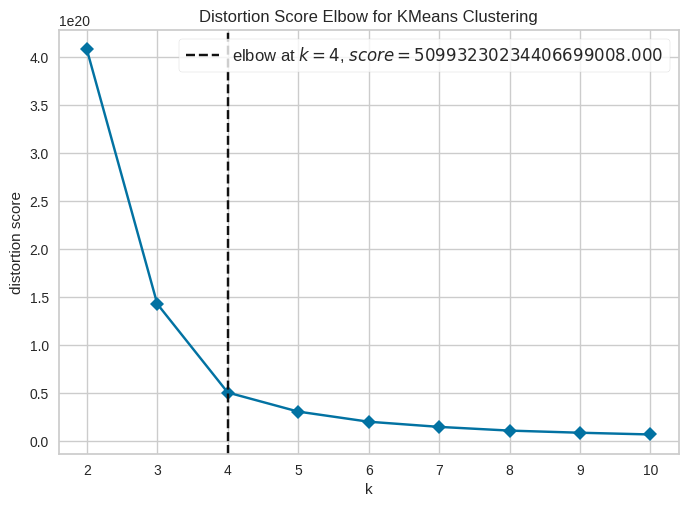

In [ ]:
plot_model(kmeans, plot='elbow')

In [ ]:
plot_model(kmeans, plot='cluster')

In [ ]:
plot_model(kmeans, plot='tsne')

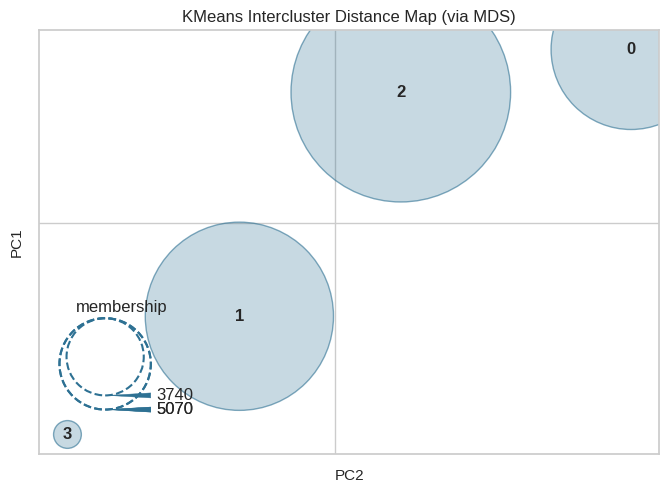

In [ ]:
plot_model(kmeans, plot='distance')

In [ ]:
plot_model(kmeans, plot='distribution')

#### Análise dos Clusters Kmeans

In [ ]:
kmeans_cluster = assign_model(kmeans)

kmeans_cluster_droped = kmeans_cluster.drop(columns=['ChaveBeneficiarioPlanoSaude','CodigoExecutante', 'CodigoSolicitante', 'Procedimento Nome', 'DtNascimento', 'DtSolicitacao', 'DtRealizacao'])

display(kmeans_cluster_droped.columns)
print('\n')
kmeans_cluster_droped.head()

Index(['Genero', 'FaixaEtaria', 'EspecialidadeExecutante',
       'EspecialidadeSolicitante', 'Procedimento Codigo', 'Qt_Autorizada',
       'valorCusto', 'Cluster'],
      dtype='object')

,Genero,FaixaEtaria,EspecialidadeExecutante,EspecialidadeSolicitante,Procedimento Codigo,Qt_Autorizada,valorCusto,Cluster
2454689,Feminino,59 e acima,Medicina Física e Reabilitação,Medicina Intensiva Pediátrica,20203047,1.0,11.83000,Cluster 3
827682,Masculino,54 a 58,Clinica Medica,Clinica Medica,10101039,1.0,0.00000,Cluster 1
27779,Feminino,59 e acima,Clinica Medica,Clinica Medica,60000554,1.0,554.48999,Cluster 2
2254986,Feminino,00 a 18,Fonoaudiólogo,Fonoaudiólogo,50000616,1.0,105.00000,Cluster 1
2637301,Feminino,54 a 58,Nao Informado,Clinica Medica,70705330,3.0,5.79000,Cluster 1


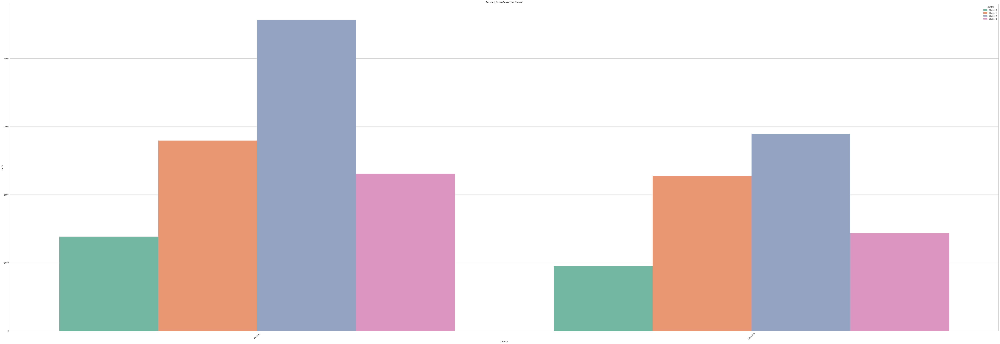

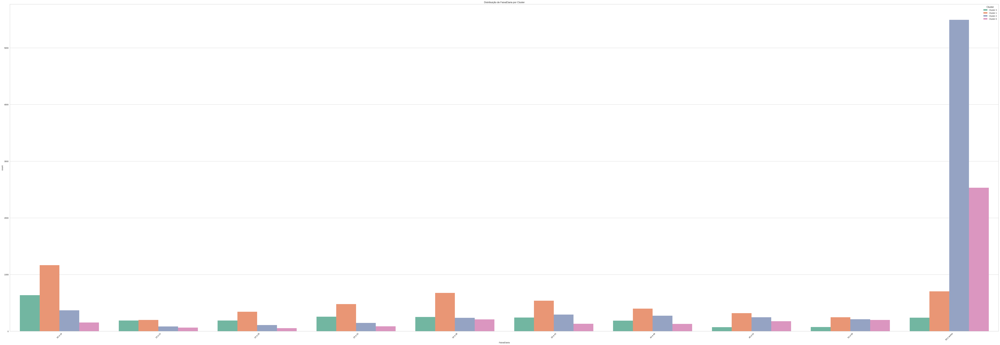

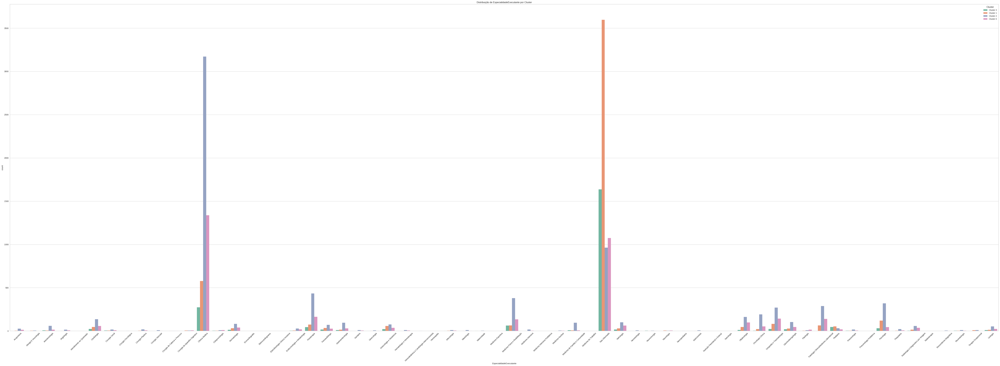

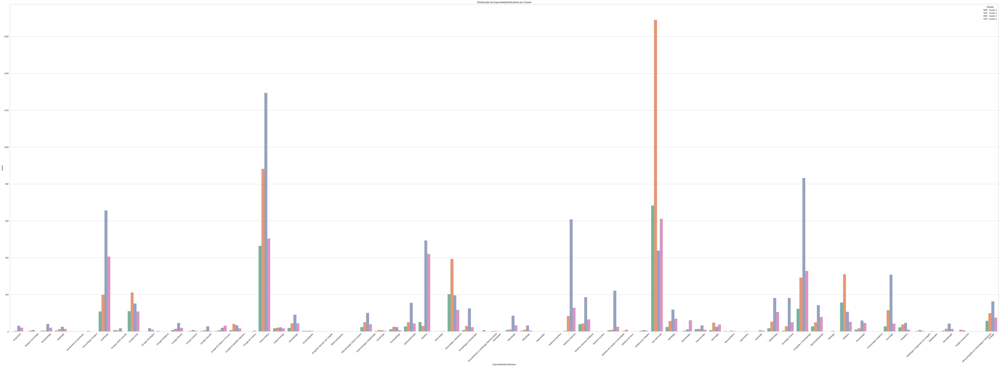

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

categorical_features = ['Genero', 'FaixaEtaria', 'EspecialidadeExecutante', 'EspecialidadeSolicitante']

for feature in categorical_features:
    plt.figure(figsize=(90, 30))
    sns.countplot(data=kmeans_cluster_droped, x=feature, hue='Cluster', palette='Set2')
    plt.title(f'Distribuição de {feature} por Cluster')
    plt.xticks(rotation=45)
    plt.show()
    print('\n')

In [ ]:
summary = kmeans_cluster_droped.groupby('Cluster').agg({
    'Qt_Autorizada': ['mean', 'sum'],
    'valorCusto': ['mean', 'sum']
}).reset_index()

summary.columns = ['Cluster', 'Qt_Autorizada_mean', 'Qt_Autorizada_sum', 'valorCusto_mean', 'valorCusto_sum']

summary['Custo/Quantidade'] = summary['valorCusto_sum'] / summary['Qt_Autorizada_sum']

print("Resumo estatístico por Cluster (com razão Custo/Quantidade):")
print(summary[['Cluster', 'Qt_Autorizada_mean', 'Qt_Autorizada_sum', 'valorCusto_mean', 'valorCusto_sum', 'Custo/Quantidade']])

Resumo estatístico por Cluster (com razão Custo/Quantidade):
     Cluster  Qt_Autorizada_mean  Qt_Autorizada_sum  valorCusto_mean  \
0  Cluster 0            2.979412            11143.0       120.743996   
1  Cluster 1            2.477515            12561.0        64.100853   
2  Cluster 2            3.849813            28735.0       113.956200   
3  Cluster 3            1.912988             4463.0        73.627693   

   valorCusto_sum  Custo/Quantidade  
0    451582.53125         40.526119  
1    324991.31250         25.873045  
2    850569.06250         29.600454  
3    171773.40625         38.488327  


In [ ]:
df_encoded = pd.get_dummies(kmeans_cluster_droped, drop_first=True)

In [ ]:
display(df_encoded.columns)
print('\n')
df_encoded.tail()

Index(['Qt_Autorizada', 'valorCusto', 'Genero_Masculino',
       'FaixaEtaria_19 a 23', 'FaixaEtaria_24 a 28', 'FaixaEtaria_29 a 33',
       'FaixaEtaria_34 a 38', 'FaixaEtaria_39 a 43', 'FaixaEtaria_44 a 48',
       'FaixaEtaria_49 a 53',
       ...
       'Procedimento Codigo_98903527', 'Procedimento Codigo_98903543',
       'Procedimento Codigo_98903551', 'Procedimento Codigo_98903560',
       'Procedimento Codigo_98904027', 'Procedimento Codigo_9898989801',
       'Procedimento Codigo_99999927', 'Cluster_Cluster 1',
       'Cluster_Cluster 2', 'Cluster_Cluster 3'],
      dtype='object', length=2371)

,Qt_Autorizada,valorCusto,Genero_Masculino,FaixaEtaria_19 a 23,FaixaEtaria_24 a 28,FaixaEtaria_29 a 33,FaixaEtaria_34 a 38,FaixaEtaria_39 a 43,FaixaEtaria_44 a 48,FaixaEtaria_49 a 53,...,Procedimento Codigo_98903527,Procedimento Codigo_98903543,Procedimento Codigo_98903551,Procedimento Codigo_98903560,Procedimento Codigo_98904027,Procedimento Codigo_9898989801,Procedimento Codigo_99999927,Cluster_Cluster 1,Cluster_Cluster 2,Cluster_Cluster 3
419660,1.0,10.020000,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
880959,1.0,1.560000,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1452780,1.0,182.830002,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1387448,1.0,8.340000,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
827361,1.0,30.360001,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [ ]:
corr_spearman = df_encoded.corr(method='spearman')

In [ ]:
corr_spearman[-3:].style.background_gradient(cmap='coolwarm')

,Qt_Autorizada,valorCusto,Genero_Masculino,FaixaEtaria_19 a 23,FaixaEtaria_24 a 28,FaixaEtaria_29 a 33,FaixaEtaria_34 a 38,FaixaEtaria_39 a 43,FaixaEtaria_44 a 48,FaixaEtaria_49 a 53,FaixaEtaria_54 a 58,FaixaEtaria_59 e acima,EspecialidadeExecutante_Alergia E Imunologia,EspecialidadeExecutante_Anestesiologia,EspecialidadeExecutante_Angiologia,EspecialidadeExecutante_Atendimento ao Queimado,EspecialidadeExecutante_Cardiologia,EspecialidadeExecutante_Cirurgia Geral,EspecialidadeExecutante_Cirurgia Oncológica,EspecialidadeExecutante_Cirurgia Plastica,EspecialidadeExecutante_Cirurgia Vascular,EspecialidadeExecutante_Cirurgia de Cabeca e Pescoco,EspecialidadeExecutante_Cirurgia do Aparelho Digestivo,EspecialidadeExecutante_Clinica Medica,EspecialidadeExecutante_Coloproctologia,EspecialidadeExecutante_Dermatologia,EspecialidadeExecutante_Ecocardiografia,EspecialidadeExecutante_Eletrocardiograma,EspecialidadeExecutante_Eletrofisiologia Clínica Invasiva,EspecialidadeExecutante_Endocrinologia e Metabologia,EspecialidadeExecutante_Fisioterapia,EspecialidadeExecutante_Fonoaudiólogo,EspecialidadeExecutante_Gastroenterologia,EspecialidadeExecutante_Geriatria,EspecialidadeExecutante_Ginecologia,EspecialidadeExecutante_Ginecologia e Obstetricia,EspecialidadeExecutante_Hematologia e Hemoterapia,EspecialidadeExecutante_Hemodinâmica e Cardiologia Intervencionista,EspecialidadeExecutante_Homeopatia,EspecialidadeExecutante_Infectologia,EspecialidadeExecutante_Mastologia,EspecialidadeExecutante_Maternidade,EspecialidadeExecutante_Medicina Esportiva,EspecialidadeExecutante_Medicina Física e Reabilitação,EspecialidadeExecutante_Medicina Intensiva,EspecialidadeExecutante_Medicina Intensiva Pediátrica,EspecialidadeExecutante_Medicina Nuclear,EspecialidadeExecutante_Medicina de Família e Comunidade,EspecialidadeExecutante_Medicina do Trabalho,EspecialidadeExecutante_Nao Informado,EspecialidadeExecutante_Nefrologia,EspecialidadeExecutante_Neonetologia,EspecialidadeExecutante_Neurocirurgia,EspecialidadeExecutante_Neurologia,EspecialidadeExecutante_Neuropediatria,EspecialidadeExecutante_Nutricionista,EspecialidadeExecutante_Nutrição Parenteral e Enteral,EspecialidadeExecutante_Nutrologia,EspecialidadeExecutante_Oftalmologia,EspecialidadeExecutante_Oncologia Clínica,EspecialidadeExecutante_Ortopedia e Traumatologia,EspecialidadeExecutante_Otorrinolaringologia,EspecialidadeExecutante_Patologia,EspecialidadeExecutante_Patologia Clinica/Medicina Laboratorial,EspecialidadeExecutante_Pediatria,EspecialidadeExecutante_Pneumologia,EspecialidadeExecutante_Pneumologia Pediátrica,EspecialidadeExecutante_Psicologia,EspecialidadeExecutante_Psiquiatria,EspecialidadeExecutante_Radiologia e Diagnostico por Imagem,EspecialidadeExecutante_Radioterapia,EspecialidadeExecutante_Ressonância Magnética,EspecialidadeExecutante_Reumatologia,EspecialidadeExecutante_Terapia Ocupacional,EspecialidadeExecutante_Urologia,EspecialidadeSolicitante_Alergia E Imunologia,EspecialidadeSolicitante_Anestesiologia,EspecialidadeSolicitante_Angiologia,EspecialidadeSolicitante_Atendimento ao Queimado,EspecialidadeSolicitante_Cancerologia Cirurgica,EspecialidadeSolicitante_Cardiologia,EspecialidadeSolicitante_Cirurgia Cardio Vascular,EspecialidadeSolicitante_Cirurgia Geral,EspecialidadeSolicitante_Cirurgia Oncológica,EspecialidadeSolicitante_Cirurgia Pediatrica,EspecialidadeSolicitante_Cirurgia Plastica,EspecialidadeSolicitante_Cirurgia Toracica,EspecialidadeSolicitante_Cirurgia Vascular,EspecialidadeSolicitante_Cirurgia de Cabeca e Pescoco,EspecialidadeSolicitante_Cirurgia do Aparelho Digestivo,EspecialidadeSolicitante_Cirurgia do Trauma,EspecialidadeSolicitante_Clinica Medica,EspecialidadeSolicitante_Coloproctologia,EspecialidadeSolicitante_Dermatologia,EspecialidadeSolicitante_Ecocardiografia,EspecialidadeSolicitante_Ecografia Vascular com Doppler,EspecialidadeSolicitante_Eletrocardiograma,EspecialidadeSolicitante_Eletrofisiologia Clínica Invasiva,EspecialidadeSolicitante_Endocrinologia e Metabo

In [ ]:
print('Correlações com o Cluster 1')
display(corr_spearman['Cluster_Cluster 1'].sort_values(ascending=False))

print('\n')

print('Correlações com o Cluster 2')
display(corr_spearman['Cluster_Cluster 3'].sort_values(ascending=False))

print('\n')

print('Correlações com o Cluster 3')
display(corr_spearman['Cluster_Cluster 2'].sort_values(ascending=False))

Correlações com o Cluster 1


,Cluster_Cluster 1
Cluster_Cluster 1,1.000000
EspecialidadeExecutante_Nao Informado,0.399413
EspecialidadeSolicitante_Nao Informado,0.235932
FaixaEtaria_34 a 38,0.139389
FaixaEtaria_29 a 33,0.116655
...,...
EspecialidadeSolicitante_Geriatria,-0.129281
Cluster_Cluster 3,-0.231714
EspecialidadeExecutante_Clinica Medica,-0.235221
FaixaEtaria_59 e acima,-0.420541




Correlações com o Cluster 2


,Cluster_Cluster 3
Cluster_Cluster 3,1.000000
EspecialidadeExecutante_Nao Informado,0.241213
FaixaEtaria_19 a 23,0.116978
EspecialidadeSolicitante_Nao Informado,0.106314
FaixaEtaria_29 a 33,0.099258
...,...
EspecialidadeSolicitante_Medicina Intensiva,-0.079030
EspecialidadeExecutante_Clinica Medica,-0.143008
Cluster_Cluster 1,-0.231714
FaixaEtaria_59 e acima,-0.287299




Correlações com o Cluster 3


,Cluster_Cluster 2
Cluster_Cluster 2,1.000000
FaixaEtaria_59 e acima,0.416325
EspecialidadeExecutante_Clinica Medica,0.247189
EspecialidadeSolicitante_Medicina Intensiva,0.148485
EspecialidadeSolicitante_Medicina de Família e Comunidade,0.108440
...,...
FaixaEtaria_34 a 38,-0.132022
EspecialidadeSolicitante_Nao Informado,-0.264354
Cluster_Cluster 3,-0.309881
EspecialidadeExecutante_Nao Informado,-0.438908
